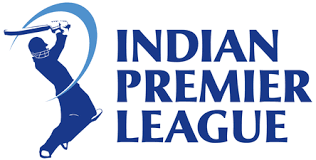

# Data Analysis and Visualization of IPL

### IPL Introduction

Setting a legendary milestone in the world of cricket, the BCCI created IPL. The exact combination of sports and entertainment to its fullest as to attract most of the audiences even the once who have never watched cricket before the beginning of the IPL in 2008.
For further information [click here](https://en.wikipedia.org/wiki/Indian_Premier_League)

The contents of the following analysis is as shown:

* **[Matches stats](#team_stats)**
    * Matches played in each city
    * Number of times each team scored more than 200
    * Toss win vs match win
    * Number of IPL titles won by each team
    * Season winners
    * Win percentage

* **[Batsman stats](#batsman_stats)**
    * Best batsman
    * Number of centuries scored by a player
    * Number of half centuries sored by a player
    * Number of sixes hit by a player
    * Number of boundaries hit by a player

* **[Bowler stats](#bowler_stats)**
    * Best bowler
    * Best bowling average

* **[Fielding stats](#fielding_stats)**
    * Most catches caught by a player
    * Number of run outs made by a player

* **[Man of the matches](#man_of_the_matches)**

* **[D/L method applied](#dl_method)**

In [22]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
df = pd.read_csv("deliveries.csv",squeeze = True)
data = pd.read_csv("matches.csv",squeeze = True)
df["batting_team"]= df["batting_team"].astype("str")

<a id="team_stats"></a>
## Team Stats

### Matches played in each city

*IPL is held throughout in India in various cities. Fans are like 12th man of any team, so playing in home ground for any team gives enoromous amount of boost to the players. Due to some inconvinience IPL was held in* *<u>South Africa</u>* *in 2009 and in* *<u>Dubai</u>* *in 2014. Maximum number of matches played in each city is sorted and represented.*

Text(0.5, 1.0, 'no of matches played in each city')

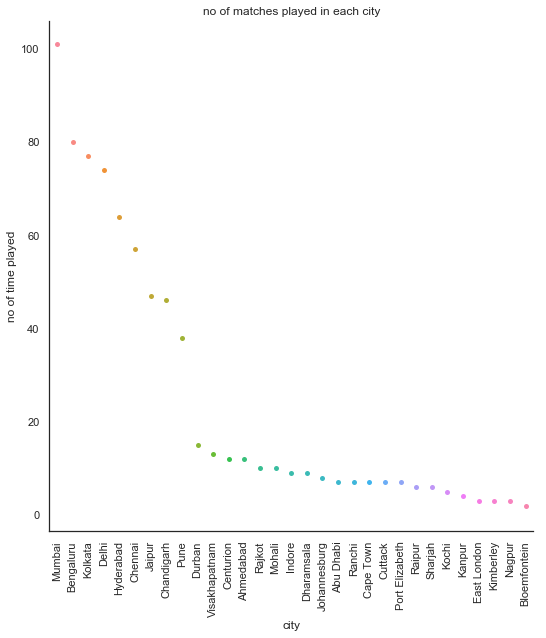

In [23]:
see=data["city"].value_counts().reset_index()
see = data['city'].apply(lambda x: str(x))
see = data['city'].apply(lambda x: "Bengaluru" if x =="Bangalore" else x)
see=see.value_counts().reset_index()
see.columns=["city","no of time played"]
sns.set(style="white")
sns.catplot(x="city",y="no of time played",data=see,kind="swarm",height =8);
plt.xticks(rotation=90)
plt.title("no of matches played in each city")

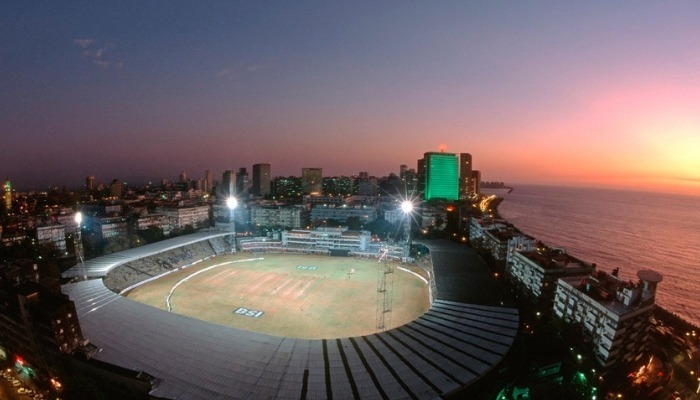

*Most matches are played in mumbai. Also India lifted the 2nd world cup.* 

### Number of times each team scored more than 200

*IPL has legendary players in each and every team and each one of them try to get a solid score for their team. Scoring 200 was like mirale before the start of IPL and also is initial stages of the IPL.*

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10], <a list of 11 Text xticklabel objects>)

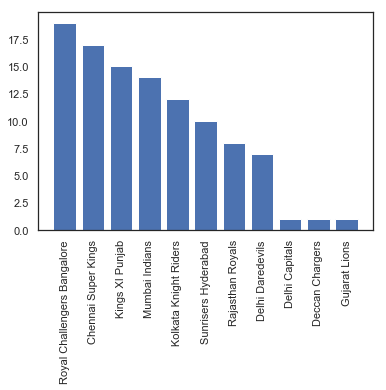

In [24]:
deliveries = pd.read_csv('deliveries.csv')
matches = pd.read_csv('matches.csv')
high_scores=deliveries.groupby(['match_id', 'inning','batting_team','bowling_team'])['total_runs'].sum().reset_index() 
high_scores=high_scores[high_scores['total_runs']>=200]
high_scores.nlargest(11415,'total_runs')
k= high_scores["batting_team"].value_counts().reset_index()
k.columns=["Team","No of times scored 200 or more"]
plt.bar("Team","No of times scored 200 or more",data=k)
plt.xticks(rotation=90)

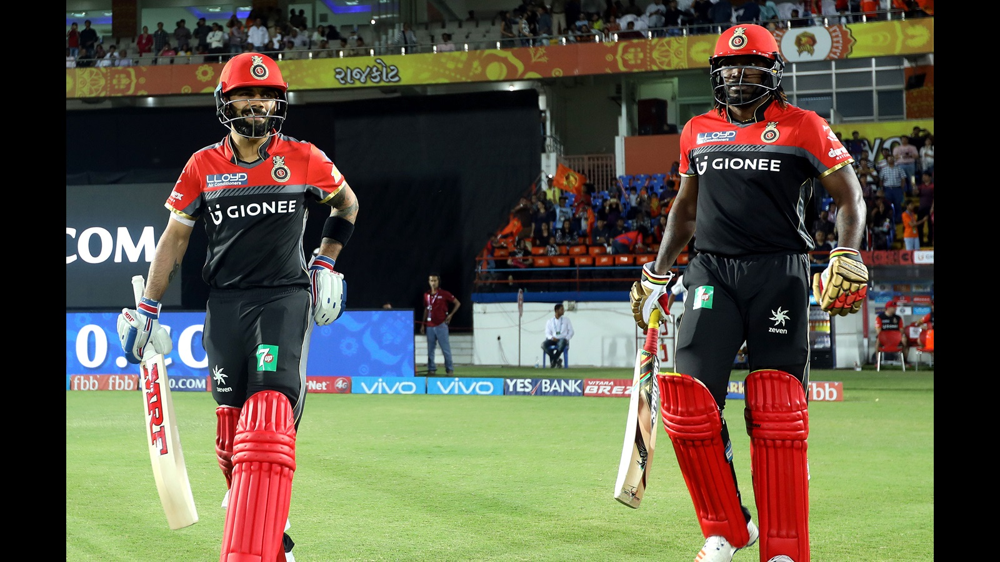

*The team with most number of 200 or more score is none other than the fantasy team RCB, it is the team which is loaded with the best T20 batsmens in the world. The teams having scores more than 200 is filtered and represented.*

### Toss win vs Matches win

In [25]:
import plotly.graph_objects as go
tw=data["toss_winner"].value_counts().sum()
win_toss_win_match=data[(data['toss_winner'] == data['winner'])]
df = pd.DataFrame({"Team won the toss":[ win_toss_win_match.shape[0],]}, index = ['Won match']).reset_index()
percentage=(df["Team won the toss"]/tw)*100
labels=["won","lost"]
values=["393","360"]
d=[go.Pie(labels=labels,values=values)]
fig=go.Figure(d)
fig.show()

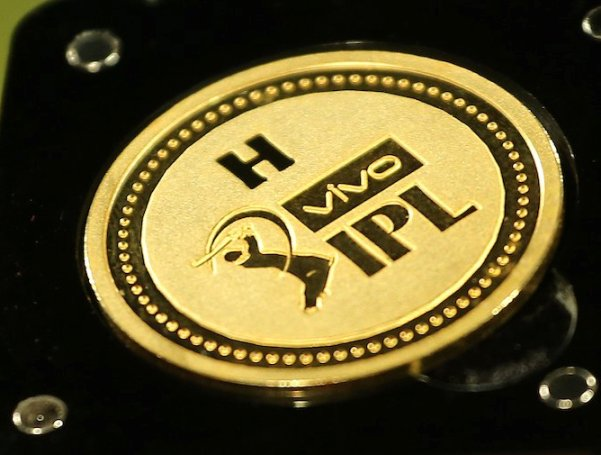

*Winning toss will also influence the confidence of the team. Initial win makes the team bit more confident. Winning is quiet crcuial in some condition, as the condition changes it gets tough. The win and loss percentage is representsed in the pie chart*

### Number of IPL titles won by each team

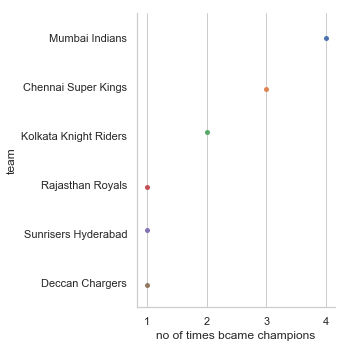

In [26]:
matches =pd.read_csv("matches.csv")
win_toss_win_match=data[(data['toss_winner'] == data['winner'])]
df = pd.DataFrame({"Team won the toss":[ win_toss_win_match.shape[0],]}, index = ['Won match'])
win_season=matches.drop_duplicates(subset=['season'],keep='last')[['season','winner']].reset_index(drop=True)
win_season=win_season['winner'].value_counts().reset_index()
win_season.columns=["team","no of times bcame champions"]
match=pd.read_csv('matches.csv')
sns.set_style("whitegrid")
sns.catplot(x="no of times bcame champions",y="team",data=win_season)

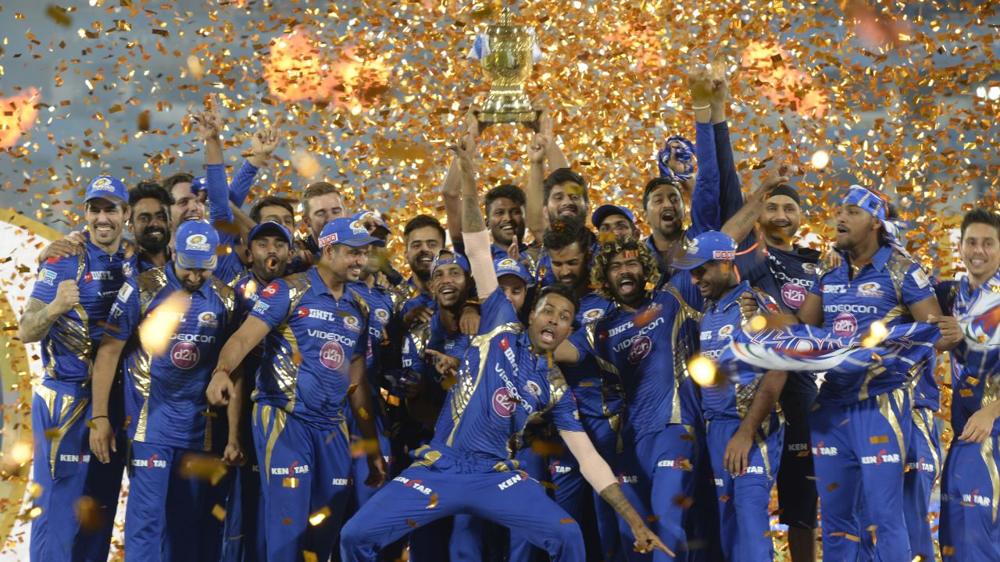

*Out of the thirteen teams that have played in the Indian Premier League since its inception, one team has won the competition fout times, one team has won the competition thrice, one team has won the competition twice and three other teams have won it once. Mumbai Indians are the most successful team in league's history in terms of the number of titles won. The Chennai Super Kings have won 3 titles, the Kolkata Knight Riders have won two titles, and the other three teams who have won the tournament are the Deccan Chargers, Rajasthan Royals and Sunrisers Hyderabad. The current champions are Mumbai Indians who beat Chennai Super Kings in the final of the 2019 season to secure their fourth title and thus became the most successful team in IPL history ever.*

### Season winners

<BarContainer object of 12 artists>

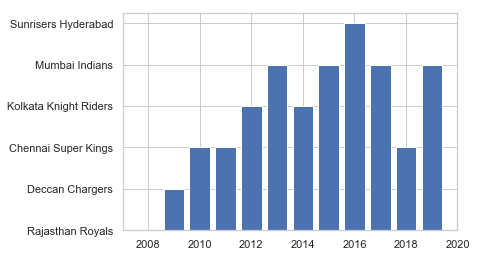

In [27]:
season_winners=data.groupby('season')['season','winner'].tail(1)
season_winners=season_winners.sort_values('season',ascending = True)
plt.bar("season","winner",data=season_winners)  

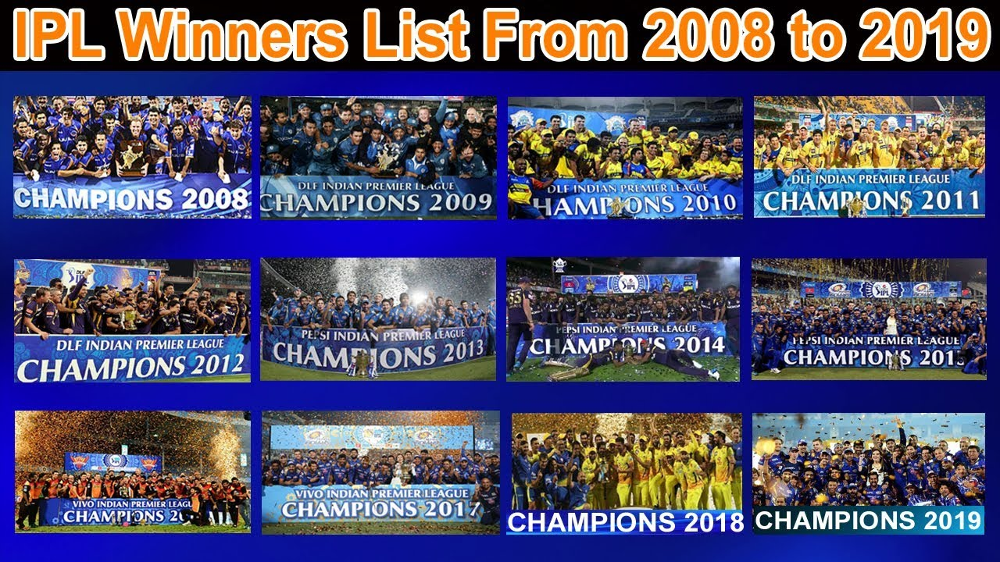

*How much ever strong every team might be,but at the end of the tournament the champions title is reserved only for one team. They win the IPL trophy of that year. The teams with maximum number of tropies are sorted and represented.*

### Win percentage

Text(0.5, 1.0, 'win percentage(%)')

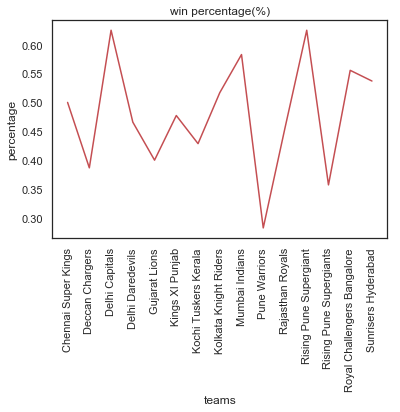

In [28]:
matches_played=pd.concat([data["team1"],data["team2"]])
matches_played=matches_played.value_counts().reset_index()
matches_played.columns=["teams","total mactches"]
matches_played["wins"]=data["winner"].value_counts().reset_index()["winner"]
percentage=matches_played["wins"]/matches_played["total mactches"]
matches_played["percentage"]=percentage
sns.set(style="white")
sns.lineplot(x="teams",y="percentage",data=matches_played,color="r");
plt.xticks(rotation=90)
plt.title("win percentage(%)")

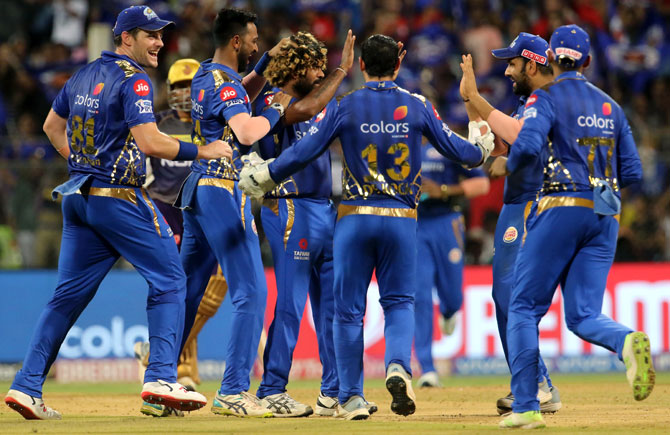

*In IPL,win percentage refers to ratio of  total number of matches won by each team to the total number of matches won by each team.*

*Mumbai Indians is the team having maximun win percentage. Almost they won 3 matches out of every 5 matches.*

<a id="batsman_stats"></a>
## Batsman stats

In [29]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
df = pd.read_csv("deliveries.csv",squeeze = True)
df["batting_team"]= df["batting_team"].astype("str")

### Best batsman

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



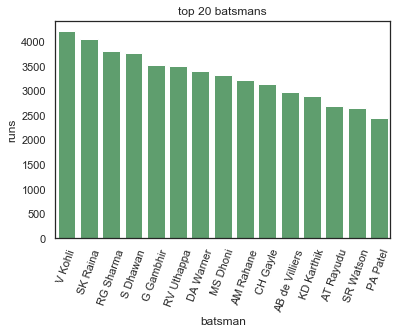

In [30]:
for i in range(len(df['batsman_runs'])):
        if df["batsman_runs"][i] == 7:
            df['batsman_runs'][i] = 6
k = df["batsman"]
m = pd.value_counts(k) 
j = m.head(15).reset_index()
j.columns = ["batsman","runs"]
ik = sns.barplot("batsman","runs",data = j,color = "g")
plt.title("top 20 batsmans")
plt.xticks(rotation = 70)
plt.show()

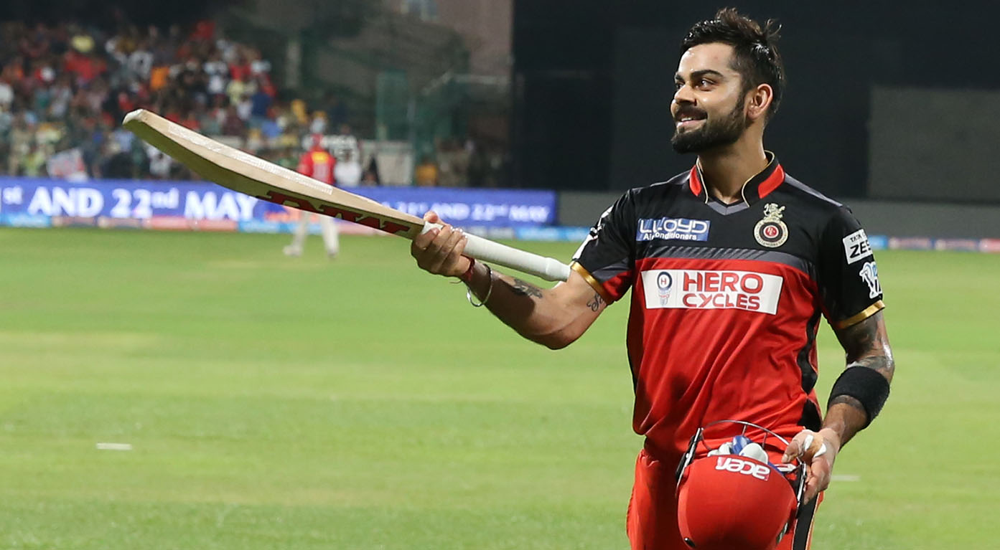

*No doubt Virat Kohli is the best batsman in all the formats of cricket.Based on maximun runs scored by a batsman in IPL,some of the best batsmans in IPL are sorted out and visualised.*

### Number of centuries scored by a player

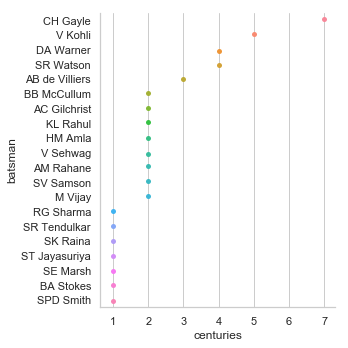

In [31]:
runsinmatch = df.groupby(["batsman","match_id"]).agg({'batsman_runs':'sum'}).reset_index()
runsinmatch.sort_values(by="batsman_runs",ascending=False)
hundred=runsinmatch[runsinmatch["batsman_runs"]>=100]
hundred=hundred["batsman"].value_counts().reset_index()
hundred.columns=["batsman","centuries"]
hundred.head(2)
sns.set_style("whitegrid")
sns.catplot(x="centuries",y="batsman",data=hundred.head(20))

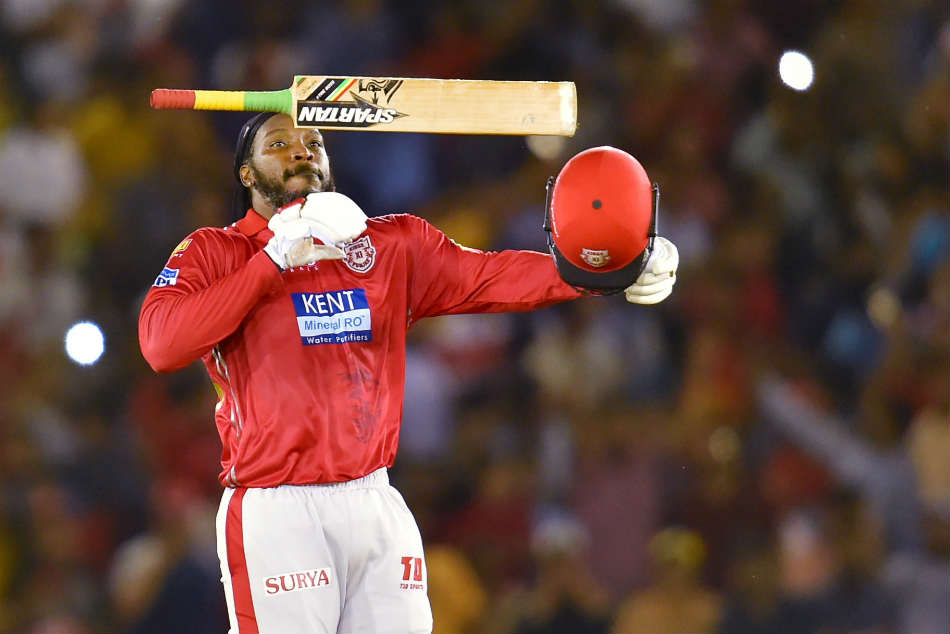

*Hundreds are the milestone for every player.These hundreds can turn any match upside down and can be a winning point to the team.Chris Gayle holds the most number of centuries in IPL.The players with most of the centuries in whole of IPL is sorted out by the code and represented in the graph shown.*

### Number of half centuries scored by a player

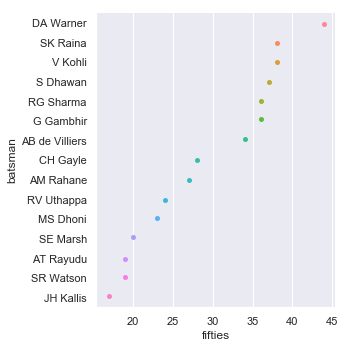

In [32]:
runsinmatch = df.groupby(["batsman","match_id"]).agg({'batsman_runs':'sum'}).reset_index()
runsinmatch.sort_values(by="batsman_runs",ascending=False)
fifty=runsinmatch[(runsinmatch["batsman_runs"]<100)&(runsinmatch["batsman_runs"]>=50)]
fifty=fifty["batsman"].value_counts().reset_index()
fifty.columns=["batsman","fifties"]
sns.set_style("darkgrid")
sns.catplot(x="fifties",y="batsman",data=fifty.head(15))

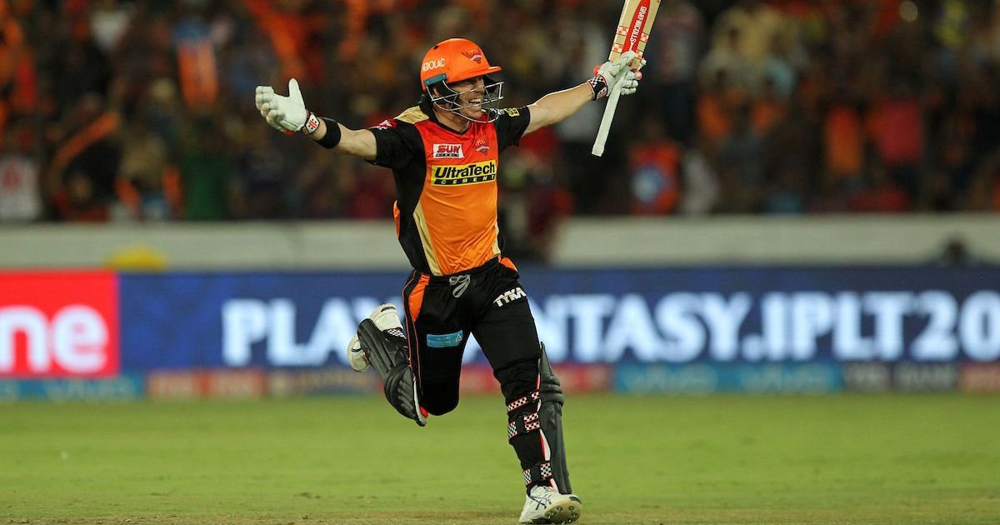

*Getting a half century  is as  good  as  getting the full on confidence of a player.It is a small mark before setting up a thunder in the field.The most half centuries in IPL is held David Warner with tremendous 44 half centuries.This data is visualised the graph.*

### Number of sixes hit by a player

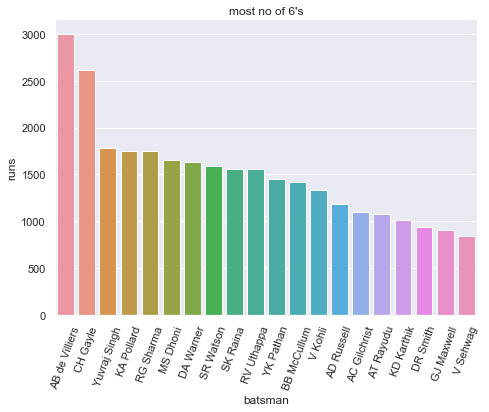

In [33]:
df2 = pd.read_csv("deliveries.csv")
lst = list()
for i in range(len(df2["batsman_runs"])):
    if df2["batsman_runs"][i] == 6:
        p = df2["batsman"][i]
        for j in range(len(df2["batsman"][i])):
            lst.append(p)
i=pd.value_counts(lst).head(20).reset_index()
i.columns = ["batsman","runs"]
sns.catplot("batsman","runs",data = i,kind = "bar", height=5, aspect=11.7/8.27)
plt.title("most no of 6's")
plt.xticks(rotation = 70)
plt.show()

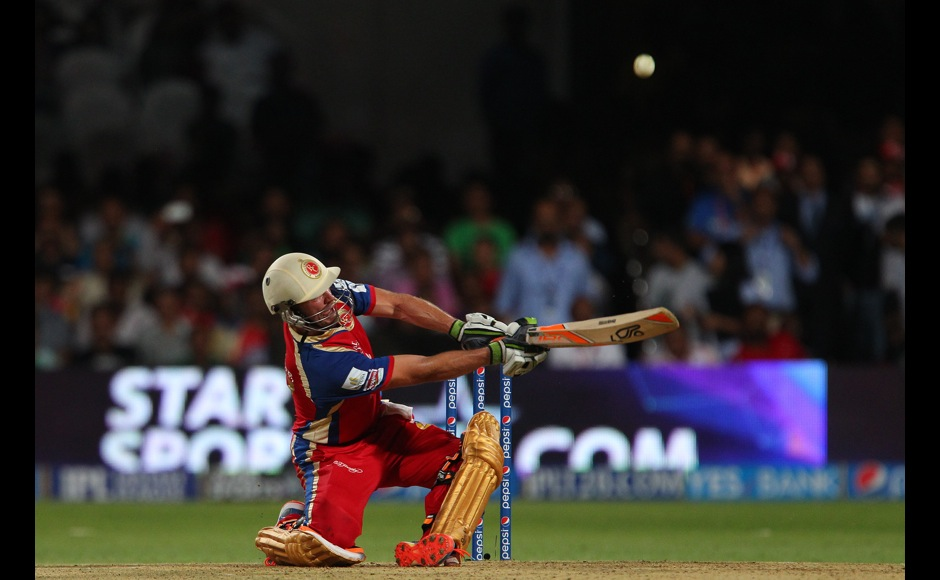

*Sixes are the factors which excites the crowd in any period of match.Fans wait for theie favourite player to hit a biggie.The players with most number of sixes are sorted and some of them are represented in the graph.*

### Number of fours hit by a player

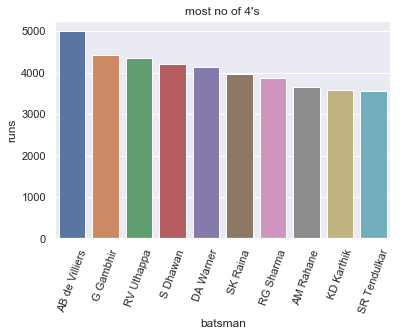

In [34]:
df2 = pd.read_csv("deliveries.csv")
lst = list()
for i in range(len(df2["batsman_runs"])):
    if df2["batsman_runs"][i] == 4:
        p = df2["batsman"][i]
        for j in range(len(df2["batsman"][i])):
            lst.append(p)
h=pd.value_counts(lst).head(10).reset_index()
h.columns = ["batsman","runs"]
sns.barplot("batsman","runs",data = h)
plt.title("most no of 4's")
plt.xticks(rotation = 70)
plt.show()

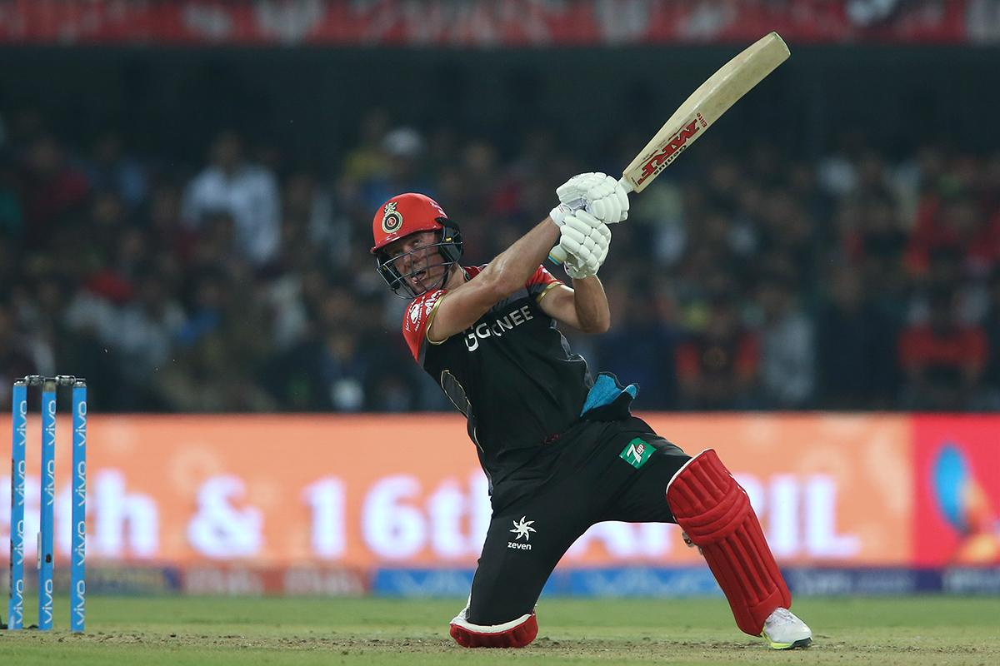

*No surprise but AB De Villers holds the most number of fours too.He is also known as Mr.360 for his batting ablities and is appritiated all over the world for his shot seletion.The players with most number of fours is sorted out and represented.*

<a id="bowler_stats"></a>
## Bowler stats

In [35]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
df = pd.read_csv("deliveries.csv",squeeze = True)
df["batting_team"]= df["batting_team"].astype("str")

### Best bowler

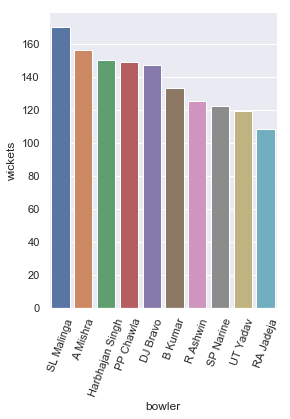

In [36]:
mask = df[df["dismissal_kind"].notnull()]
mask1 = mask["dismissal_kind"] != "run out"
k = df["batsman_runs"]==7
l = mask[mask1]
k = l["bowler"]
m = pd.value_counts(k).reset_index().head(10)
m.columns = ["bowler","wickets"]
sns.catplot(x="bowler",y="wickets",data = m,kind = "bar", aspect=6/7,height=5)
plt.xticks(rotation = 70)
plt.show()

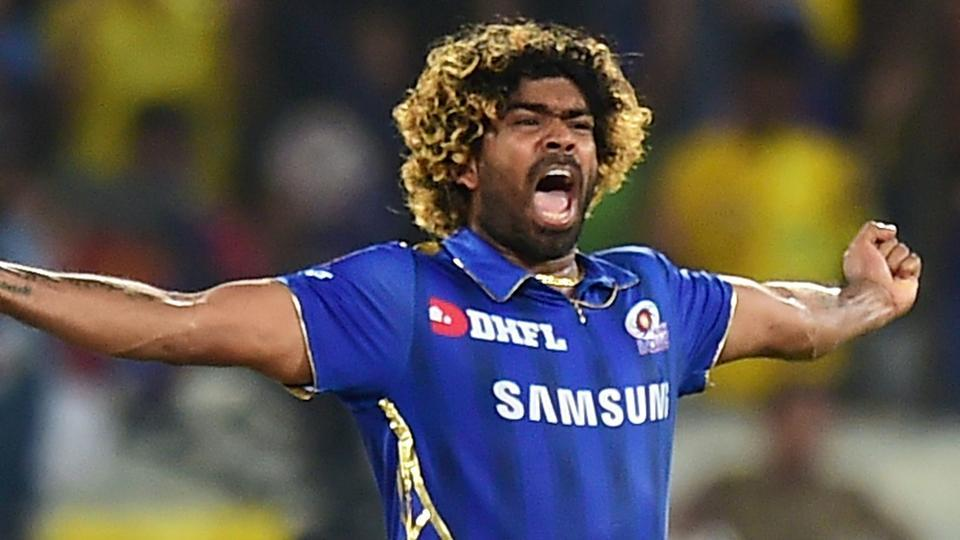

*Bowling is one of the main aspects in cricket.In the sport of cricket bowling is the action of propelling the ball toward the wicket defended by a batsman. A player skilled at bowling is called a bowler; a bowler who is also a competent batsman is known as an all-rounder. Bowling the ball is distinguished from throwing the ball by a strictly specified biomechanical definition which restricts the angle of extension of the elbow.The best bowlers depend upon the wickets taken is sorted out and represented.SL malinga stands at first place by taking maximum number of wickets *

### Best bowling average

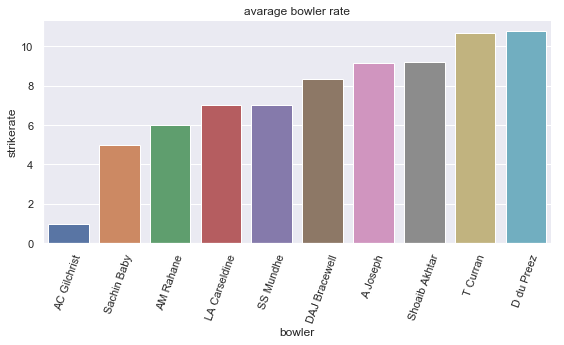

In [37]:
df3 = pd.read_csv("deliveries.csv")
k=df3["bowler"].sort_values()
no_of_balls=k.value_counts()
dit1 = no_of_balls.sort_values()
mask9 = df[df["dismissal_kind"].notnull()]
mask8 = mask9["dismissal_kind"] != "run out"
l = mask9[mask8]
k1 = l["bowler"]
m = pd.value_counts(k1)
dit2 = m.sort_values()
k = dit1/dit2
k.dropna()
j = k.sort_values(ascending = True).head(10).reset_index()
j.columns = ["bowler","strikerate"]
sns.catplot("bowler","strikerate",data = j,kind = "bar",aspect =8/4,height=4)
plt.title("avarage bowler rate")
plt.xticks(rotation = 70)
plt.show()

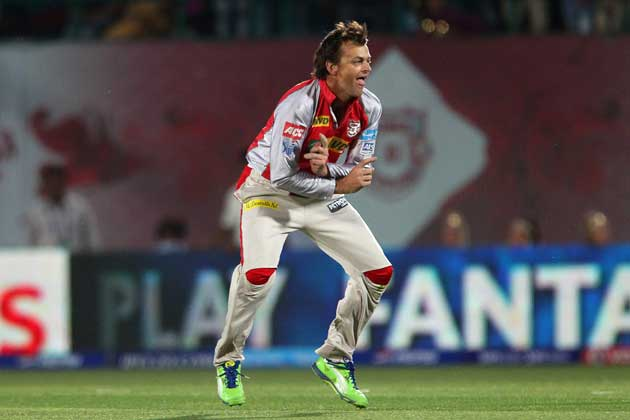

*A player's bowling average is the number of runs they have conceded per wicket taken. The lower the bowling average is, the better the bowler is performing. It is one of a number of statistics used to compare bowlers, commonly used alongside the economy rate and the strike rate to judge the overall performance of a bowler.I,e. bowling average=runs conceded/wickets taken.The bowlers with highest bowling average is calculated and represented.*

<a id="fielding_stats"></a>
## Fielding stats

### Most catches caught by a player

In [38]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

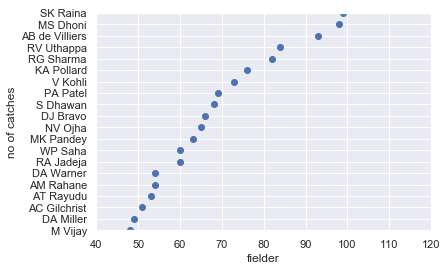

In [39]:
data=pd.read_csv('deliveries.csv')
player=data[(data.fielder.notnull())&(data.dismissal_kind=='caught')]
caught=player["fielder"].value_counts().reset_index()
caught.columns=["fielder","no of catches"]
plt.xlabel('fielder')
plt.ylabel('no of catches')
plt.xlim(40,120)
plt.ylim(20)
plt.scatter(x='no of catches',y='fielder',color='b',data=caught)
plt.show()

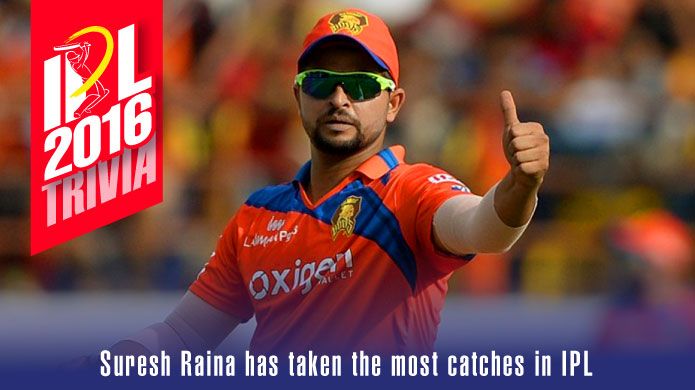

*“Catches win matches”.It doesnt matter if u only have a num 1 ranking batsman in the team,because the
match cant be won by a batsman single handedly.
For this purpose,every player is reponsible to be good in fielding.If they miss a catch,that can affect the result
of the match.No doubt Sir.Jadeja is the best fielder In the world ,but still “Suresh Raina” has taken most catches
in the IPl history and standing 1 st among the list.
This data is analised and players with most catches in IPL is represented in the graph.*

### Number of run out made by player

Text(0.5, 1.0, 'run outs count')

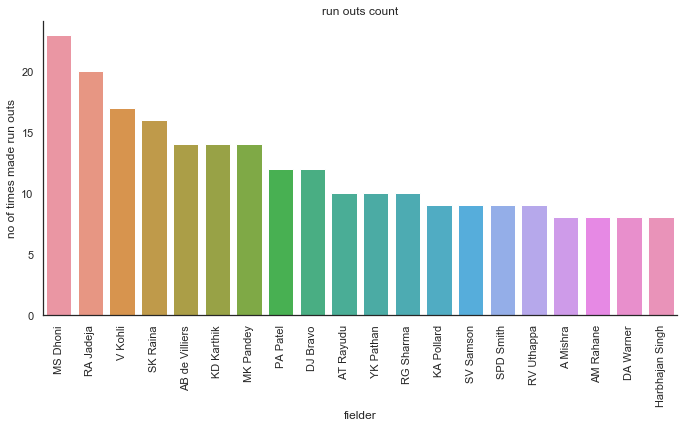

In [40]:
df=pd.read_csv('deliveries.csv')                   
run_outs1=df[df["dismissal_kind"].notnull()]
run_outs=run_outs1["dismissal_kind"]=="run out"
ro=run_outs1[run_outs]
out=ro["fielder"]
out=pd.value_counts(out).reset_index()
out.columns=["fielder","no of times made run outs"]
sns.set(style="white")
sns.catplot(x="fielder",y="no of times made run outs",data=out.head(20),kind="bar",aspect=2);
plt.xticks(rotation=90)
plt.title("run outs count")

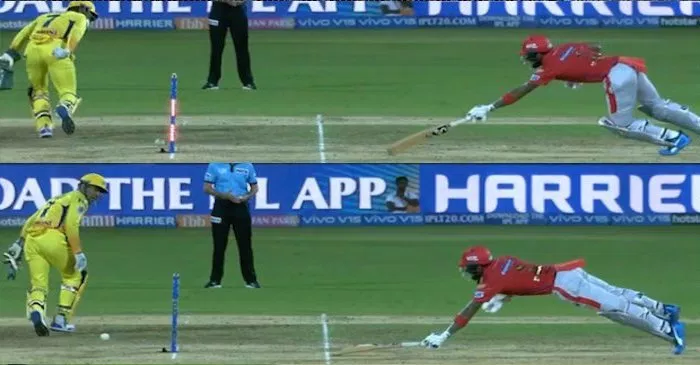

*Run out is a method of  dismissal  in the sport of  cricket  governed by Law 38 of the  Laws of cricket .
One of the other kind of run out is known as MANKAD.
During bowling,if a bowler turns his arm round and rather than releasing the ball,hits out the bails of the non-
striking batsman and runs him out, then this type of dismissal is called as a Mankad.
The data represented shows the players with most numberof run outs.
In IPL, the most number of run out are made by MS Dhoni of Chennai super kings team.*

<a id="man_of_the_matches"></a>
## Man of the matches

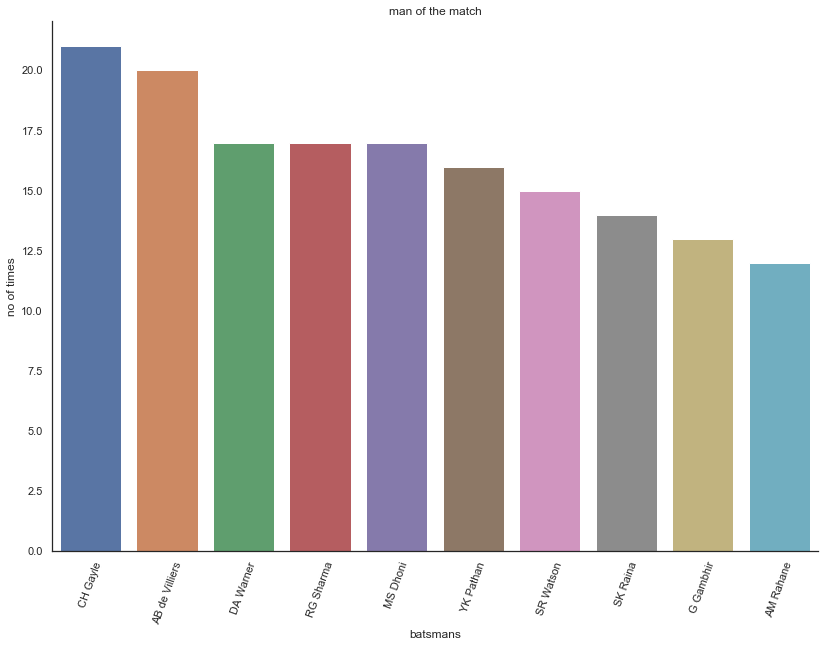

In [41]:
df1 = pd.read_csv("matches.csv")
o=df1["player_of_match"].value_counts().head(10).reset_index()
o.columns = ["batsmans","no of times"]
sns.catplot("batsmans","no of times",data = o,height=8.27,kind = "bar", aspect=11.7/8.27)
sns.grid = "white"
plt.title("man of the match")
plt.xticks(rotation = 70)
plt.show()

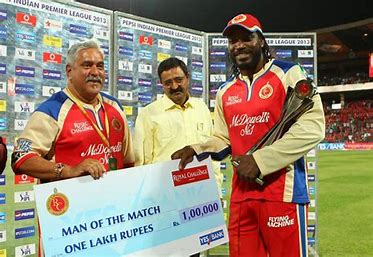

*In cricket, the man of the match award became a regular feature in Test matches in the mid 1980s.The man of
the match title is usually awarded to the player whose contribution is seen as the most critical in winning the
game.
In one match held on 3 April 1996, the whole team from New Zeland was awarded the Men of the Match
award. It was the first instance when a whole team was awarded it. 
In IPL,Chris gayle holds the record for the highest number of awards won, with 21 in IPL.
In our code,we have filtered out the dataset and represented the max MOM wrt players using pandas and
visualisaing modules.*

<a id="dl_method"></a>
## D/L method applied

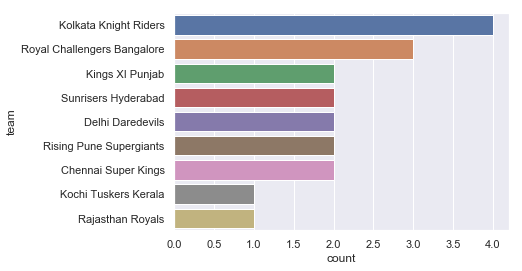

In [42]:
df=pd.read_csv("matches.csv")
new=df.loc[ df['dl_applied']!=0,['dl_applied','winner']]
dls=new["winner"].value_counts().reset_index()
dls.columns=["team","count"]
sns.set_style("darkgrid")
sns.barplot(x="count",y="team",data=dls)

*The Duckworth–Lewis–Stern method (DLS) is a mathematical formulation designed to calculate the target
score for the team batting second in a ”limited overs cricket” match interrupted by weather or other
circumstances. The method was devised by two English  statisticians ,  Frank Duckworth  and  Tony Lewis  and was
formerly known as the Duckworth–Lewis method (D/L). 
The DLS method is an attempt to set a statistically fair target for the second team&#39;s innings, which is the
same difficulty as the original target. The basic principle is that each team in a limited-overs match has two
resources available with which to score runs (overs to play and wickets remaining), and the target is adjusted
proportionally to the change in the combination of these two resources.
Here are the count of teams won maximum times with DL method applied.*

<a id="Conclusion"></a>
## Conclusion

* This data set contains analysis of IPL matches from 2008-2019.
* The best Teams and best players in all formats has been filtered and represented in above data analysis.
* Overall Mumbai Indians has best bowler, most season winners and more winning percentage.
